**YOUR NAMES HERE**

Fall 2023

CS 343: Neural Networks

Project 4: Transfer Learning

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from PIL import Image

import tf_util
from deep_dream import DeepDream

plt.show()
plt.style.use(['seaborn-v0_8-colorblind', 'seaborn-v0_8-darkgrid'])
plt.rcParams.update({'font.size': 16})

np.set_printoptions(suppress=True, precision=3)

# Automatically reload external modules
%load_ext autoreload
%autoreload 2

2023-12-09 19:22:20.304590: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Task 3: DeepDream

You will make use of a pre-trained neural network (`VGG19`) to implement the **DeepDream (gradient ascent)** algorithm using TensorFlow to generate art with a neural network! The algorithm projects the receptive fields of specific filters and/or layers onto the input image to create some trippy effects! A neat side effect of this process is that you can visualize how learned weights at different levels of the network interact with parts of the input image.

This task will expose you to TensorFlow's low level API that operates on image data in the Tensor data structure.

### Overview

1. Load in the VGG19 pre-trained network without the output layer.
2. Make a readout model — a `Keras Model` object that allows us extract activations (`netActs`) within the subset of VGG19 network layers of our choice. Neurons in these layers of the VGG19 network will "dream": modify the input image to amplify patterns that the cells "want to see" based on their learned weight patterns. 
3. Select the types of layers (e.g. conv, pooling, etc) that we want to use to run Deep Dream on to influence the input (generated) image.
4. Pass image through the readout network model, compute the netAct values and gradient at the selected layers.
5. Do gradient ascent where we add a proportion of the gradient from a network layer back into the generated image for some number of iterations.

### 3a. Import and plot the image of Miller

`miller3_224x224.jpg` is the initial image that will serve as your **generated image**.

In the cell below:
- Load in the Miller test image `miller3_224x224.jpg` at 224 x 224 resolution. This matches the resolution of images on which VGG19 was trained.
- Normalize the image so that pixel values may span (0, 1) rather than (0, 255). Do this by dividing by 255. You should **not** use min-max normalization here (see note below)!
- Make a plot of the image.

*Why you do not want to use min-max normalization: If you have a dark image that does not have white, min-max normalization will introduce a white value when it was not there originally. This will distort the colors in your image. Dividing by the max possible pixel value (255) works around this issue.*

In [3]:
raw_image = Image.open("data/miller3_224x224.jpg")
generated_img = np.asarray(raw_image)/255
# Keep this test code
print(f'Image shape is {generated_img.shape} and should be (224, 224, 3)')
print(f'Image min/max is: {generated_img.min()}/{generated_img.max()}. It should be 0.0/1.0')

Image shape is (224, 224, 3) and should be (224, 224, 3)
Image min/max is: 0.0/1.0. It should be 0.0/1.0


### 3b. Load in pre-trained VGG19 network.

Load in the [pre-trained VGG19 network](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG19) and set it to a variable called `pretrained_net`. Make sure the existing weights are not trainable and don't load/include the trained output layer.

If you call the `summary()` method on the network object, you should see the following at the bottom:

    Total params: 20,024,384
    Trainable params: 0
    Non-trainable params: 20,024,384

In [4]:
pretrained_net = tf.keras.applications.VGG19(include_top=False)
pretrained_net.trainable = False
pretrained_net.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

### 3c. Write `load_pretrained_net` to automate loading of pretrained network

In `tf_util.py`, adapt your code from the previous subtask to write the `load_pretrained_net` function. This function automates the process of loading the pretrained network and paves the way for possibly loading in pre-trained networks other than VGG19.

Call your function in the cell below. Calling the `summary` method on the returned pretrained network object should produce the same output as in Task 3b.

In [5]:
pretrained_net = tf_util.load_pretrained_net("vgg19")
pretrained_net.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

### 3d. Create a list of `VGG19` network layer names and those whose activation we want to sample

In `tf_util.py`, implement the following functions:
- `get_all_layer_strs(pretrained_net)`: Extract a list of strings from the pretrained network that represents all the layer names.
- `filter_layer_strs(layer_names, match_str='block5')`: Filter out layer names from the complete list that have a certain substring. For example, return the subset of layers that have `'block5'` in their name. This is the list of **selected layers** whose activity we will amplify by adding their gradient back into the input image (i.e. these layers will "do the dreaming").

Run the following test code below to check your implementations. Each function should be short (~1-5 lines of code).

In [18]:
# Get all layer names
layer_names = tf_util.get_all_layer_strs(pretrained_net)
print(f'Your full list of layers contains {len(layer_names)} names and it should contain 22.')
print(f'Your first layer name is {layer_names[0]} and it should be input_2.')
print(' It is not a problem if you have a different int after the underscore (e.g. input_3)')
print(f'Your last layer name is {layer_names[-1]} and it should be block5_pool.')

print()
selected_layer_names = tf_util.filter_layer_strs(layer_names, match_str='block5')
print(f'Your selected layer names are:\n{selected_layer_names}\nand they should be')
print("['block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4', 'block5_pool']")

Your full list of layers contains 22 names and it should contain 22.
Your first layer name is input_7 and it should be input_2.
 It is not a problem if you have a different int after the underscore (e.g. input_3)
Your last layer name is block5_pool and it should be block5_pool.

Your selected layer names are:
['block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4', 'block5_pool']
and they should be
['block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4', 'block5_pool']


### 3e. Preprocess initial generated image

In `tf_util.py`, implement the function `preprocess_image2tf(img, as_var)`. This function takes the initial generated image (e.g. `miller3.jpg`) in Numpy ndarray format and converts it to a TensorFlow Variable tensor.

In the cell below, call your function to preprocess the test image of Miller as a TensorFlow Variable. Name the preprocessed image `generated_img_tf`.

In [7]:
generated_img_tf = tf_util.preprocess_image2tf(np.asarray(Image.open("data/miller3_224x224.jpg")), True)
# Keep below test code
print(f'The shape of the initial generated image is {generated_img_tf.shape} and should be (1, 224, 224, 3)')
print(f'The min/max of the initial generated image is {tf.reduce_min(generated_img_tf)}/{tf.reduce_max(generated_img_tf)} and should be 0.0/1.0')
print(f"The datatype of the initial generated image is {generated_img_tf.dtype} and should be <dtype: 'float32'>")
print(f'The initial generated image is trainable? {hasattr(generated_img_tf, "trainable")}. It should be!')

The shape of the initial generated image is (1, 224, 224, 3) and should be (1, 224, 224, 3)
The min/max of the initial generated image is 0.0/1.0 and should be 0.0/1.0
The datatype of the initial generated image is <dtype: 'float32'> and should be <dtype: 'float32'>
The initial generated image is trainable? False. It should be!


### 3f. Build VGG19 selected layer readout model

When we do the forward pass with the generated image (e.g. `miller3`), we get activations in every network layer. However, we only want a select group of layers to influence the input image (e.g. only those with `block5` in the name). We could in principle take the list of ALL the netActs and extract the netActs we want according to indices of the desired layers, but there is more overhead with this approach since there are a lot of netAct values we won't use! It is more convenient to build a `tf.keras.Model` object based on the pretrained network that returns a list of netActs *in only the layers we specify*. We will call this model that returns the subset of layer netActs that we care about **the readout model**.

In `tf_util.py`, implement the function `make_readout_model(pretrained_net, layer_names)` that builds the readout model.

In [8]:
test_readout_model = tf_util.make_readout_model(pretrained_net, selected_layer_names)

tf.random.set_seed(0)
test_input = tf.random.uniform(shape=(1, 224, 224, 3))
test_net_acts = test_readout_model(test_input)
print(f'Number of layers of netAct returned is {len(test_net_acts)} and should be 5')
print(f'Shape of first layer of netActs is {test_net_acts[0].shape} and should be (1, 14, 14, 512)')
print(f'First few netAct values of first layer filters in top-left corner:\n{test_net_acts[0][0,0,0,:5]}')
print('and they should be:')
print('[1.415 0.    4.176 0.    0.   ]')
print(f'Shape of last layer of netActs is {test_net_acts[-1].shape} and should be (1, 7, 7, 512)')
print(f'First few netAct values of last layer filters in top-left corner:\n{test_net_acts[-1][0,0,0,:5]}')
print('and they should be:')
print('[0.394 0.    0.    0.    0.554]')


Number of layers of netAct returned is 5 and should be 5
Shape of first layer of netActs is (1, 14, 14, 512) and should be (1, 14, 14, 512)
First few netAct values of first layer filters in top-left corner:
[1.415 0.    4.176 0.    0.   ]
and they should be:
[1.415 0.    4.176 0.    0.   ]
Shape of last layer of netActs is (1, 7, 7, 512) and should be (1, 7, 7, 512)
First few netAct values of last layer filters in top-left corner:
[0.394 0.    0.    0.    0.554]
and they should be:
[0.394 0.    0.    0.    0.554]


### 3g. Start implementing Deep Dream network

Implement the following `DeepDream` class methods in `deep_dream.py`:
- Constructor
- `loss_layer(self, layer_net_acts)`: Computes one selected layer's contribution to the total loss. This is the mean activation (`netAct`) across the layer.
- `forward(self, gen_img, eps=1e-8, standardize_grads=True)`: Does the forward pass with the generated image, computes the total loss, and computes the gradient of the loss with respect to the input generated image. If `standardize_grads` is set to `True`, the image gradients should be standardized according to the usual formula (see below).

#### Image gradient standardization

The following equation computes the standardized image gradient $\hat{g}_{i,j}$ at pixel $(i,j)$ in the image gradient.

$$
\hat{g}_{i,j} = \frac{g_{i,j} - \mu_g}{\sigma_g + \epsilon}
$$

where $g_{i,j}$ is the original/raw gradient of the image $(i,j)$ with respect to the total loss (i.e. `d_image`), $\mu_g$ is the mean of the image gradients, $\sigma_g$ is the standard deviation of the image gradients, and $\epsilon$ a small numer (e.g. `1e-8`) to prevent possible division by 0.

Notes:
- Remember that the shape of `d_thing` has the same shape as `thing`. So `d_image` has shape `(224, 224, 3)` — every pixel in the original image gets a gradient update.

#### (i) Test `loss_layer`

In [9]:
test_dd = DeepDream(pretrained_net, selected_layer_names)

In [10]:
tf.random.set_seed(0)
test_layer_net_acts = tf.random.uniform(shape=(1, 14, 14, 512))
test_layer_loss = test_dd.loss_layer(test_layer_net_acts)
print(f'Your test layer loss is {test_layer_loss:.5f} and should be 0.49835')

Your test layer loss is 0.49835 and should be 0.49835


#### (ii) Test `forward`

In [11]:
tf.random.set_seed(0)
test_img_tf = tf.Variable(tf.random.uniform(shape=(1, 224, 224, 3), minval=0, maxval=1))
test_loss, test_grads = test_dd.forward(test_img_tf)
print(f'Your total loss is {test_loss:.5f} and should be 0.26632')
print(f'The shape of your image gradients are {test_grads.shape} and it should be (1, 224, 224, 3)')
print(f'The first few gradients are\n{test_grads[0,0,:5,0]}\nand they should be\n[-0.137  0.375  0.997 -0.307 -1.642]')

Your total loss is 0.26632 and should be 0.26632
The shape of your image gradients are (1, 224, 224, 3) and it should be (1, 224, 224, 3)
The first few gradients are
[-0.137  0.375  0.997 -0.307 -1.642]
and they should be
[-0.137  0.375  0.997 -0.307 -1.642]


### 3h. Implement `fit`: use gradient ascent algorithm to iteratively modify generated image

The `fit` method uses **gradient ascent** to update the generated image on every epoch — i.e. the network modifies the input image across epochs based on the image gradients. The result is a surreal, trippy, dreamy effect that merges the neural and image representations.

#### Gradient ascent

$$
I(t+1) = I(t) + \alpha \times \hat{g}
$$

where $I$ is the generated image on epoch $t$, $\alpha$ is the learning rate, and $\hat{g}$ is the image gradient on the current epoch.

#### Test: Deep Dream for 1 epoch

The code below runs `fit` for one epoch.
- You should print out the estimated amount of time in minutes to complete `E` epochs.
- You should print out how many epochs have been completed out of `E` total. This should happen on the first epoch (and in general `print_every` epochs).
- `fit` should generate a plot showing the generated image after 1 epoch. *You should see cool shapes starting to emerge in the generated image*! To help make this happen, implement `tf2image(tensor)` in `tf_util.py` that converts the TensorFlow tensor into a PIL `Image` object.
- You should export a JPG of the generated image in the `deep_dream_output` folder within your project working directory (*create it if it doesn't exist*). 

Here is an example progress printout with the estimated time:

```
Epoch 0/0 completed
  1 epoch took 0.010 mins. Expected runtime is 0.010 mins.
```

*Note: the `tf.identity` makes and returns a copy of `generated_img_tf` — this way we do not modify the original Tensor of the image during this test.*


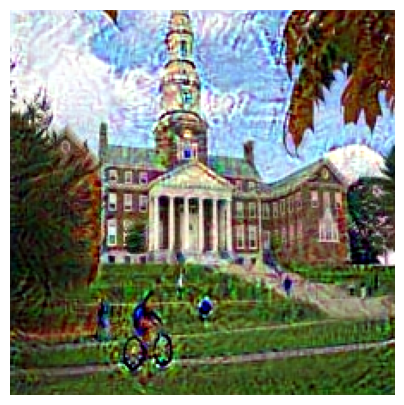

epoch 1 / 1 completed
1 epoch took: 1.1055798530578613 seconds.Expected runtime is:0.01842633088429769 minutes
Test code:
Your loss over 1 epoch is 0.4 and should be 0.4
Generated image min/max pixel values are 0.0/1.0 and should be 0.0/1.0


In [12]:
gen_img_1epoch = tf.Variable(tf.identity(generated_img_tf))
loss_hist = test_dd.fit(gen_img_1epoch, n_epochs=1, lr=0.1)
print('Test code:')
print(f'Your loss over 1 epoch is {loss_hist[0]:.1f} and should be 0.4')
print(f'Generated image min/max pixel values are {tf.reduce_min(gen_img_1epoch)}/{tf.reduce_max(gen_img_1epoch)} and should be 0.0/1.0')

### 3i. Run Deep Dream on `miller3_224x224.jpg`

In the cell below, copy-and-paste code that you've written above to:
- Load in and preprocess the initial generated image (`miller3_224x224.jpg` here).
- Load in the pretrained VGG19 network.
- Creating a `DeepDream` network and fitting it to the image over `26` epochs with the default learning rate of `0.01`.
- Only activations in layers with `block5` in the name should contribute to the loss and lead to modifications of the generated image.

The goal is to run the complete Deep Dream algorithm on a generated image without having to execute all the cells above.

The cell below should show `miller3` after running fit for 26 epochs. *Even if your computer is a few years old, this should take at most 5 minutes.*

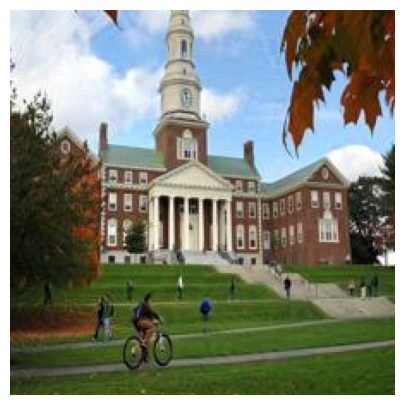

epoch 1 / 26 completed
1 epoch took: 1.033046007156372 seconds.Expected runtime is:0.4476532697677612 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed


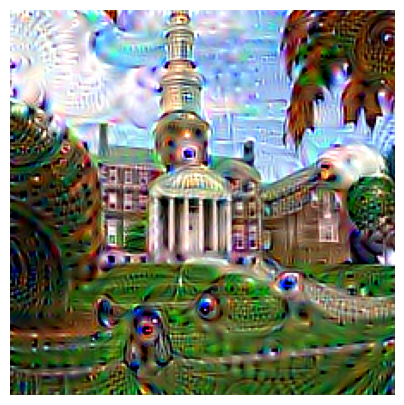

epoch 26 / 26 completed


In [13]:
miller3_2 = tf_util.preprocess_image2tf(np.asarray(Image.open("data/miller3_224x224.jpg")), True)
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(generated_img_tf))
hist = deepDream.fit(img)


### 3j. Refine Deep Dream by running it with multiple image scales

While the existing Deep Dream algorithm results in some cool effects, a little additional work can make the Deep Dream images look even better.

Implement `fit_multiscale` in `deep_dream.py`. In this version you call `fit` to run the gradient ascent algorithm on the generated image over multiple runs. Each time you finish a run, scale (resize) the image so that you run gradient ascent again on the larger version of image.

Since this is effectively repeating `gradient_ascent` a set number of times (`n_scales`), it will take longer to finish computing.

#### Test `fit_multiscale`

Copy-and-paste your code above from Task 3i, but now run `fit_multiscale` instead of `fit`. Run it with default parameters for now. The cell below should:
- show the generated image (`miller3`) after gradient ascent is run on the generated image at each scale. 
- print outs showing the progress (i.e. number of scales currently completed).
- Estimated total runtime based on the first scale.

*Even if your computer is several years old, this should take at most 5-10 mins to finish. If it is taking too long and you think that your code is working properly, run it in Davis 102 or cut down on the number of epochs and scales.*

epoch 1 / 26 completed
1 epoch took: 0.8726541996002197 seconds.Expected runtime is:0.3781501531600952 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :0completed
1 epoch took: 21.39475107192993 seconds.Expected runtime is:1.426316738128662 minutes
scale: 0


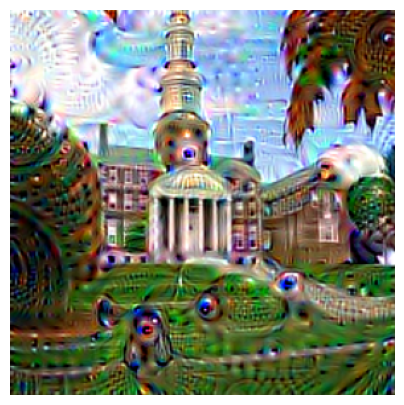

epoch 1 / 26 completed
1 epoch took: 1.4831302165985107 seconds.Expected runtime is:0.6426897605260213 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :1completed
scale: 1


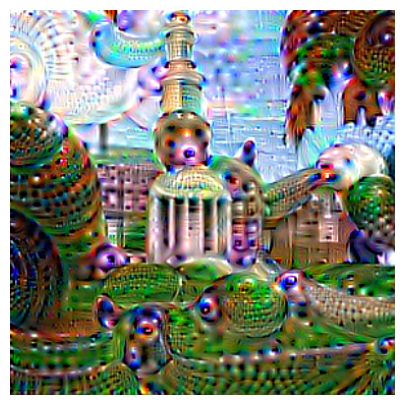

epoch 1 / 26 completed
1 epoch took: 2.232131004333496 seconds.Expected runtime is:0.9672567685445149 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :2completed
scale: 2


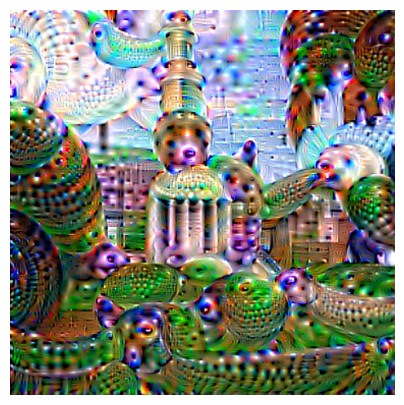

epoch 1 / 26 completed
1 epoch took: 3.859678268432617 seconds.Expected runtime is:1.6725272496541341 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :3completed
scale: 3


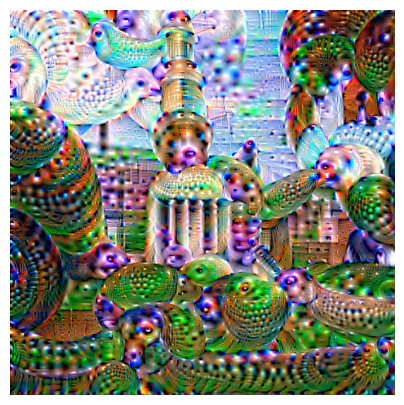

In [14]:
miller3_2 = tf_util.preprocess_image2tf(np.asarray(Image.open("data/miller3_224x224.jpg")), True)
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(miller3_2))
hist = deepDream.fit_multiscale(img)

### 3k. Run Deep Dream on at least one other image

Copy-and-paste your code again and run either the single-scale or multi-scale version of Deep Dream on another image of your choice. It could be one of the other provided images. Adjust hyperparameters as necessary so that the generated image bears some resemblance to the original image (i.e. the generated image is not totally dominated by the network influence).

**Note about the size of your image:**
- You can resize your image to 224x224, the resolution of images VGG19 was trained on.
- If you have a more powerful machine (or are willing to wait longer for prettier pictures), you can use higher resolution images. But you should start with the 224 x 224 version for debugging purposes. You can use the PIL Image resize method. Alternatively, there are numerous external tools (e.g. ImageMagick) and other Python-based ways to accomplish this.

epoch 1 / 26 completed
1 epoch took: 4.376540899276733 seconds.Expected runtime is:1.8965010563532512 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :0completed
1 epoch took: 107.46083283424377 seconds.Expected runtime is:7.1640555222829185 minutes
scale: 0


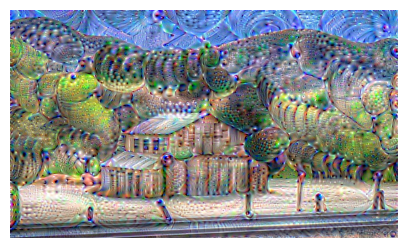

epoch 1 / 26 completed
1 epoch took: 7.245750904083252 seconds.Expected runtime is:3.139825391769409 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :1completed
scale: 1


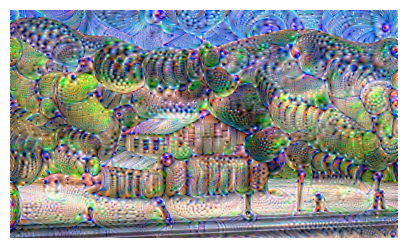

epoch 1 / 26 completed
1 epoch took: 14.266697883605957 seconds.Expected runtime is:6.182235749562581 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :2completed
scale: 2


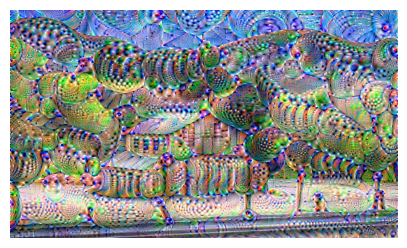

epoch 1 / 26 completed
1 epoch took: 21.488166093826294 seconds.Expected runtime is:9.31153864065806 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :3completed
scale: 3


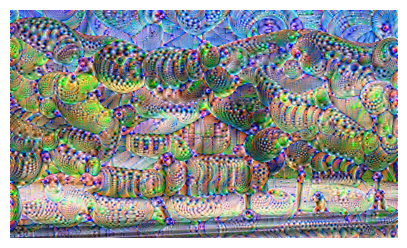

In [16]:
shed_pic= tf_util.preprocess_image2tf(np.asarray(Image.open("data/shed.jpg")), True)
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(shed_pic))
hist = deepDream.fit_multiscale(img)

### 3l. Questions

Generate one or more Deep Dream images to accompany each of your written answers to the following questions. You can include them inline with your answers below.

**Question 7:** Give at least two reasons why the multi-scale version tends to produce better visualizations. *Hint: think about the filter receptive fields involved in the process.*

**Question 8**: What differences do you notice if you only use earlier/later network layers to do the Deep Dream process?

**Question 9**: Describe what you notice when you let pooling vs different conv layers contribute to the generated image.

**Question 10**: In your own words, describe why a certain animal, texture, or shape appears in a particular spot in the generated image.

**Answer 7:**  One reason that the multi-scale version tends to produce better visualizations is that when we scale our resolution with each scaling iteration we are allowing the lower resolution kernel sized "imprints" to scale up into a greater resolution.  Additionally, the filter receptive fields are going to be relatively smaller on our image since the kernel is not scaled with the image.  This allows for progressively more minute features to be "dreamed" on.

**Answer 8**: We see that when we use deeper network layers, we are "dreaming" with higher level details of our image.  This means that we see imprints of something like a dog's face instead of eyes, hairs, or edges (relatively smaller parts of the dog) if our data was from dogs. See code with comment "question 8"

**Answer 9**: Letting pooling contribute to the image, we see the enhancement of lower level features similar to allowing the earlier layers of our network contribute. Using convolution, we can see higher level features.

**Answer 10**: We see certain animals appearing in certain places because we are using gradient ascent to make things that "look like" our filters in order to maximize that value.  For example, we can see the parrot in the bottom left corner of the image since the cloud that was originally there must look somewhat like a parrot.

epoch 1 / 26 completed
1 epoch took: 0.8841450214385986 seconds.Expected runtime is:0.3831295092900594 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :0completed
1 epoch took: 20.463407039642334 seconds.Expected runtime is:1.3642271359761555 minutes
scale: 0


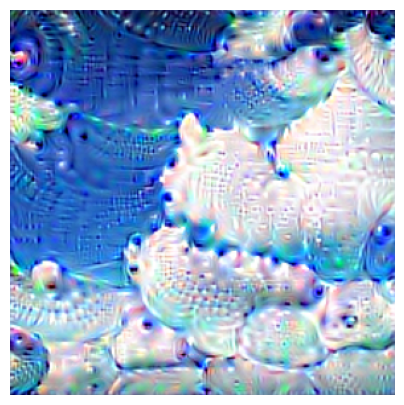

epoch 1 / 26 completed
1 epoch took: 1.4318890571594238 seconds.Expected runtime is:0.620485258102417 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :1completed
scale: 1


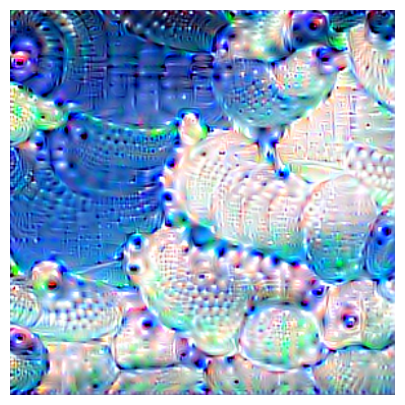

epoch 1 / 26 completed
1 epoch took: 2.4069130420684814 seconds.Expected runtime is:1.0429956515630086 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :2completed
scale: 2


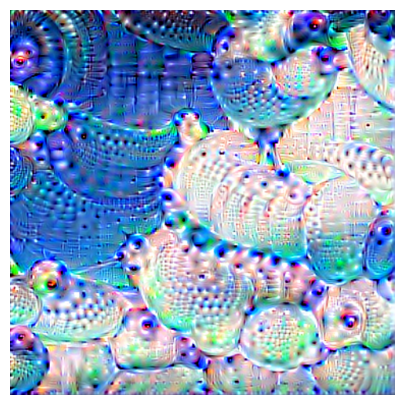

epoch 1 / 26 completed
1 epoch took: 4.0828797817230225 seconds.Expected runtime is:1.7692479054133097 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed
epoch 26 / 26 completed
fit :3completed
scale: 3


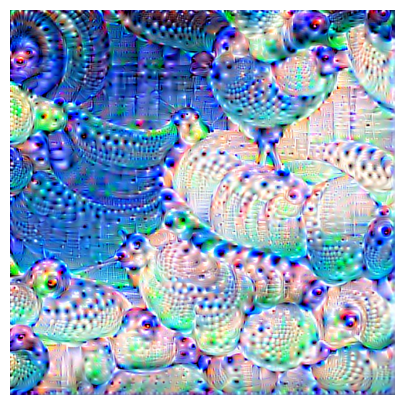

In [20]:
#question 7
clouds_img= tf_util.preprocess_image2tf(np.asarray(Image.open("data/clouds.jpg")), True)
clouds_img = tf.image.resize(clouds_img, [224,224])
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit_multiscale(img)

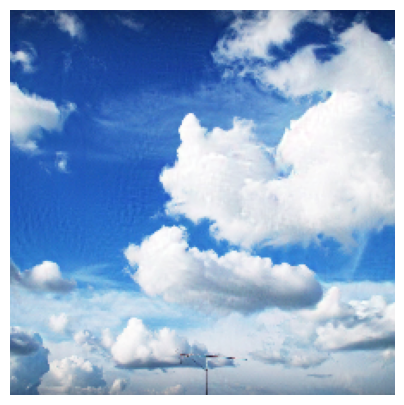

epoch 1 / 104 completed
1 epoch took: 1.2431988716125488 seconds.Expected runtime is:2.154878044128418 minutes
epoch 2 / 104 completed
epoch 3 / 104 completed
epoch 4 / 104 completed
epoch 5 / 104 completed
epoch 6 / 104 completed
epoch 7 / 104 completed
epoch 8 / 104 completed
epoch 9 / 104 completed
epoch 10 / 104 completed
epoch 11 / 104 completed
epoch 12 / 104 completed
epoch 13 / 104 completed
epoch 14 / 104 completed
epoch 15 / 104 completed
epoch 16 / 104 completed
epoch 17 / 104 completed
epoch 18 / 104 completed
epoch 19 / 104 completed
epoch 20 / 104 completed
epoch 21 / 104 completed
epoch 22 / 104 completed
epoch 23 / 104 completed
epoch 24 / 104 completed
epoch 25 / 104 completed


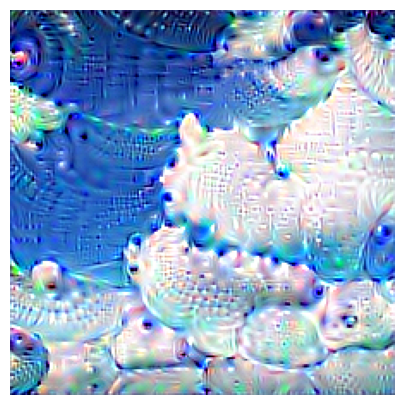

epoch 26 / 104 completed
epoch 27 / 104 completed
epoch 28 / 104 completed
epoch 29 / 104 completed
epoch 30 / 104 completed
epoch 31 / 104 completed
epoch 32 / 104 completed
epoch 33 / 104 completed
epoch 34 / 104 completed
epoch 35 / 104 completed
epoch 36 / 104 completed
epoch 37 / 104 completed
epoch 38 / 104 completed
epoch 39 / 104 completed
epoch 40 / 104 completed
epoch 41 / 104 completed
epoch 42 / 104 completed
epoch 43 / 104 completed
epoch 44 / 104 completed
epoch 45 / 104 completed
epoch 46 / 104 completed
epoch 47 / 104 completed
epoch 48 / 104 completed
epoch 49 / 104 completed
epoch 50 / 104 completed


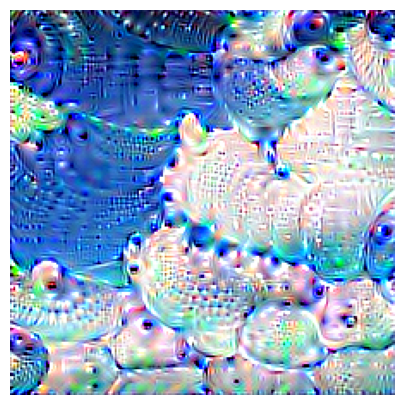

epoch 51 / 104 completed
epoch 52 / 104 completed
epoch 53 / 104 completed
epoch 54 / 104 completed
epoch 55 / 104 completed
epoch 56 / 104 completed
epoch 57 / 104 completed
epoch 58 / 104 completed
epoch 59 / 104 completed
epoch 60 / 104 completed
epoch 61 / 104 completed
epoch 62 / 104 completed
epoch 63 / 104 completed
epoch 64 / 104 completed
epoch 65 / 104 completed
epoch 66 / 104 completed
epoch 67 / 104 completed
epoch 68 / 104 completed
epoch 69 / 104 completed
epoch 70 / 104 completed
epoch 71 / 104 completed
epoch 72 / 104 completed
epoch 73 / 104 completed
epoch 74 / 104 completed
epoch 75 / 104 completed


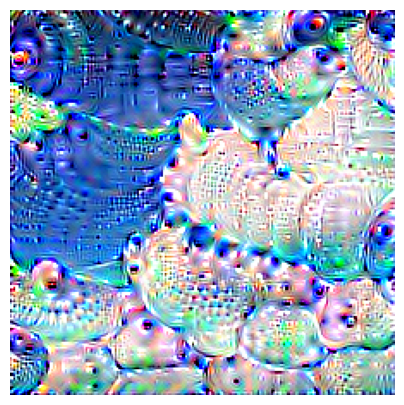

epoch 76 / 104 completed
epoch 77 / 104 completed
epoch 78 / 104 completed
epoch 79 / 104 completed
epoch 80 / 104 completed
epoch 81 / 104 completed
epoch 82 / 104 completed
epoch 83 / 104 completed
epoch 84 / 104 completed
epoch 85 / 104 completed
epoch 86 / 104 completed
epoch 87 / 104 completed
epoch 88 / 104 completed
epoch 89 / 104 completed
epoch 90 / 104 completed
epoch 91 / 104 completed
epoch 92 / 104 completed
epoch 93 / 104 completed
epoch 94 / 104 completed
epoch 95 / 104 completed
epoch 96 / 104 completed
epoch 97 / 104 completed
epoch 98 / 104 completed
epoch 99 / 104 completed
epoch 100 / 104 completed


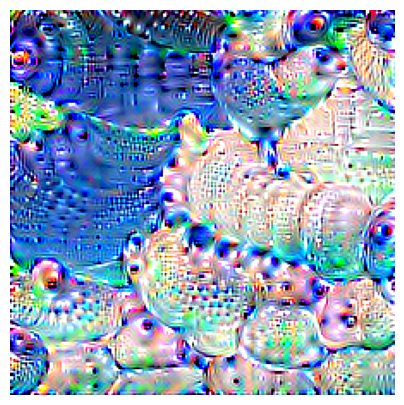

epoch 101 / 104 completed
epoch 102 / 104 completed
epoch 103 / 104 completed
epoch 104 / 104 completed


In [22]:
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit(img, n_epochs = 26*4)

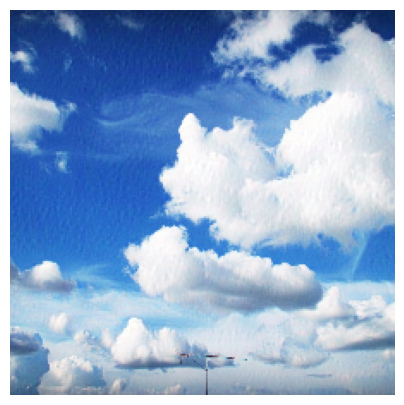

epoch 1 / 26 completed
1 epoch took: 0.8110992908477783 seconds.Expected runtime is:0.3514763593673706 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed


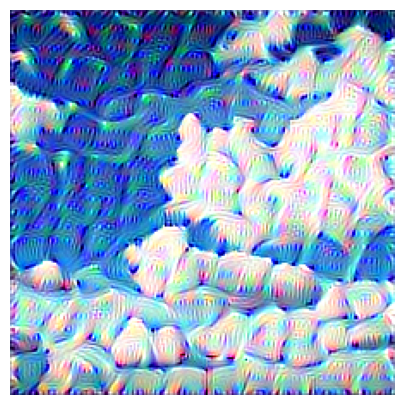

epoch 26 / 26 completed


In [23]:
#question 8
selected_layer_names = tf_util.filter_layer_strs(layer_names, match_str='block3')
clouds_img= tf_util.preprocess_image2tf(np.asarray(Image.open("data/clouds.jpg")), True)
clouds_img = tf.image.resize(clouds_img, [224,224])
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit(img)

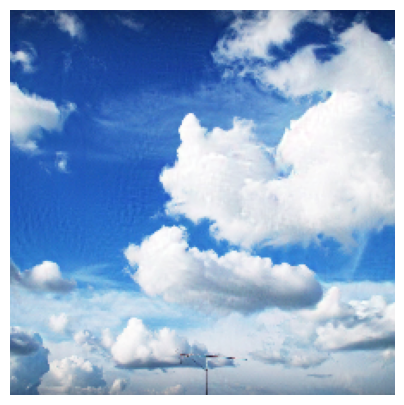

epoch 1 / 26 completed
1 epoch took: 1.1317219734191895 seconds.Expected runtime is:0.49041285514831545 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed


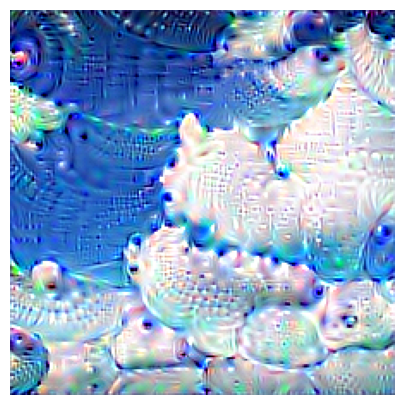

epoch 26 / 26 completed


In [24]:
selected_layer_names = tf_util.filter_layer_strs(layer_names, match_str='block5')
clouds_img= tf_util.preprocess_image2tf(np.asarray(Image.open("data/clouds.jpg")), True)
clouds_img = tf.image.resize(clouds_img, [224,224])
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit(img)

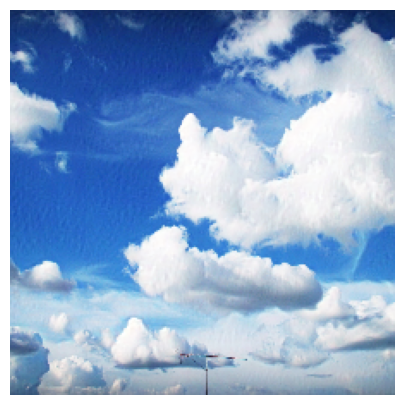

epoch 1 / 26 completed
1 epoch took: 1.2112030982971191 seconds.Expected runtime is:0.5248546759287517 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed


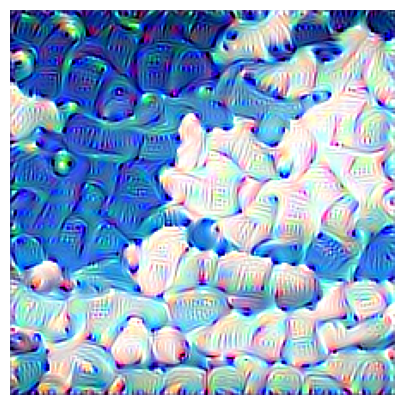

epoch 26 / 26 completed


In [27]:
#question 9
selected_layer_names = tf_util.filter_layer_strs(layer_names, match_str='pool')
clouds_img= tf_util.preprocess_image2tf(np.asarray(Image.open("data/clouds.jpg")), True)
clouds_img = tf.image.resize(clouds_img, [224,224])
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit(img)

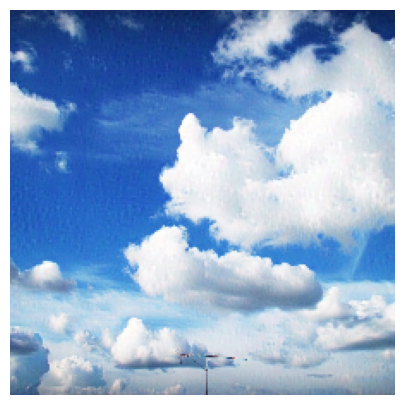

epoch 1 / 26 completed
1 epoch took: 1.1370370388031006 seconds.Expected runtime is:0.49271605014801023 minutes
epoch 2 / 26 completed
epoch 3 / 26 completed
epoch 4 / 26 completed
epoch 5 / 26 completed
epoch 6 / 26 completed
epoch 7 / 26 completed
epoch 8 / 26 completed
epoch 9 / 26 completed
epoch 10 / 26 completed
epoch 11 / 26 completed
epoch 12 / 26 completed
epoch 13 / 26 completed
epoch 14 / 26 completed
epoch 15 / 26 completed
epoch 16 / 26 completed
epoch 17 / 26 completed
epoch 18 / 26 completed
epoch 19 / 26 completed
epoch 20 / 26 completed
epoch 21 / 26 completed
epoch 22 / 26 completed
epoch 23 / 26 completed
epoch 24 / 26 completed
epoch 25 / 26 completed


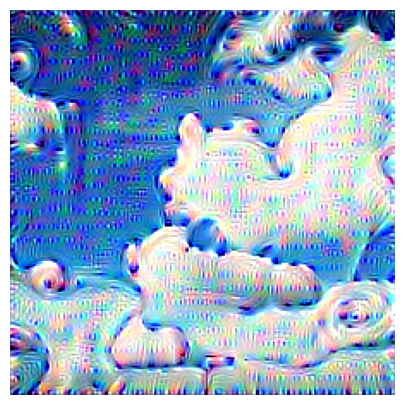

epoch 26 / 26 completed


In [28]:
selected_layer_names = tf_util.filter_layer_strs(layer_names, match_str='conv')
clouds_img= tf_util.preprocess_image2tf(np.asarray(Image.open("data/clouds.jpg")), True)
clouds_img = tf.image.resize(clouds_img, [224,224])
pretrained_net = tf_util.load_pretrained_net("vgg19")
deepDream = DeepDream(pretrained_net, selected_layer_names)
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit(img)

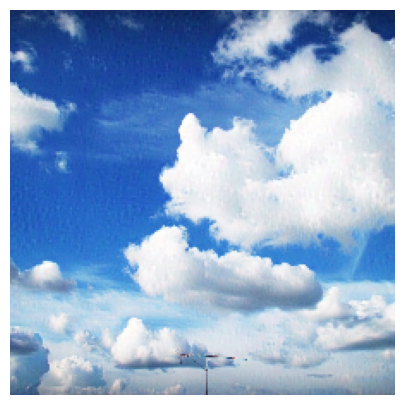

epoch 1 / 104 completed
1 epoch took: 1.225620985031128 seconds.Expected runtime is:2.1244097073872883 minutes
epoch 2 / 104 completed
epoch 3 / 104 completed
epoch 4 / 104 completed
epoch 5 / 104 completed
epoch 6 / 104 completed
epoch 7 / 104 completed
epoch 8 / 104 completed
epoch 9 / 104 completed
epoch 10 / 104 completed
epoch 11 / 104 completed
epoch 12 / 104 completed
epoch 13 / 104 completed
epoch 14 / 104 completed
epoch 15 / 104 completed
epoch 16 / 104 completed
epoch 17 / 104 completed
epoch 18 / 104 completed
epoch 19 / 104 completed
epoch 20 / 104 completed
epoch 21 / 104 completed
epoch 22 / 104 completed
epoch 23 / 104 completed
epoch 24 / 104 completed
epoch 25 / 104 completed


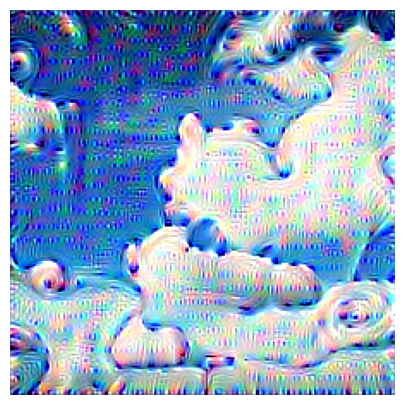

epoch 26 / 104 completed
epoch 27 / 104 completed
epoch 28 / 104 completed
epoch 29 / 104 completed
epoch 30 / 104 completed
epoch 31 / 104 completed
epoch 32 / 104 completed
epoch 33 / 104 completed
epoch 34 / 104 completed
epoch 35 / 104 completed
epoch 36 / 104 completed
epoch 37 / 104 completed
epoch 38 / 104 completed
epoch 39 / 104 completed
epoch 40 / 104 completed
epoch 41 / 104 completed
epoch 42 / 104 completed
epoch 43 / 104 completed
epoch 44 / 104 completed
epoch 45 / 104 completed
epoch 46 / 104 completed
epoch 47 / 104 completed
epoch 48 / 104 completed
epoch 49 / 104 completed
epoch 50 / 104 completed


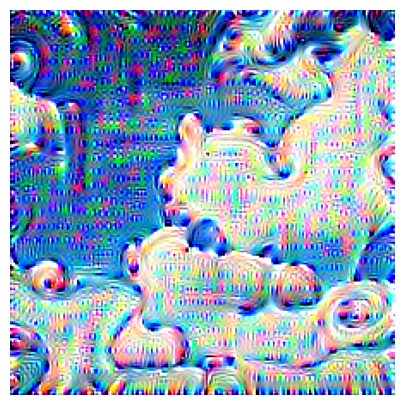

epoch 51 / 104 completed
epoch 52 / 104 completed
epoch 53 / 104 completed
epoch 54 / 104 completed
epoch 55 / 104 completed
epoch 56 / 104 completed
epoch 57 / 104 completed
epoch 58 / 104 completed
epoch 59 / 104 completed
epoch 60 / 104 completed
epoch 61 / 104 completed
epoch 62 / 104 completed
epoch 63 / 104 completed
epoch 64 / 104 completed
epoch 65 / 104 completed
epoch 66 / 104 completed
epoch 67 / 104 completed
epoch 68 / 104 completed
epoch 69 / 104 completed
epoch 70 / 104 completed
epoch 71 / 104 completed
epoch 72 / 104 completed
epoch 73 / 104 completed
epoch 74 / 104 completed
epoch 75 / 104 completed


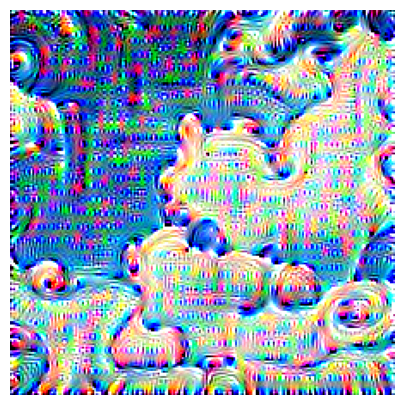

epoch 76 / 104 completed
epoch 77 / 104 completed
epoch 78 / 104 completed
epoch 79 / 104 completed
epoch 80 / 104 completed
epoch 81 / 104 completed
epoch 82 / 104 completed
epoch 83 / 104 completed
epoch 84 / 104 completed
epoch 85 / 104 completed
epoch 86 / 104 completed
epoch 87 / 104 completed
epoch 88 / 104 completed
epoch 89 / 104 completed
epoch 90 / 104 completed
epoch 91 / 104 completed
epoch 92 / 104 completed
epoch 93 / 104 completed
epoch 94 / 104 completed
epoch 95 / 104 completed
epoch 96 / 104 completed
epoch 97 / 104 completed
epoch 98 / 104 completed
epoch 99 / 104 completed
epoch 100 / 104 completed


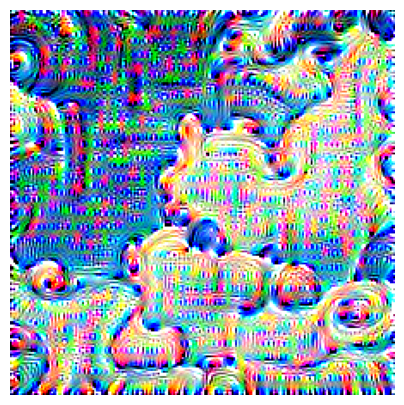

epoch 101 / 104 completed
epoch 102 / 104 completed
epoch 103 / 104 completed
epoch 104 / 104 completed


In [29]:
#question 10
img = tf.Variable(tf.identity(clouds_img))
hist = deepDream.fit(img, n_epochs = 26*4)